# Exercise 4

## Phase Portraits and Lotka-Volterra

### Lotka-Volterra Model for Competition 

First, we do a slightly different Lotka-Volterra Model, its variation for competition. Imagine we have a population of rabbits and and one of sheeps. Both are competing for the same limited food supply (grass). Similar to the logistic growth model, each population will have its own carrying capacity. Both reproduce, but rabbits reproduce a bit faster than sheep. When a sheep and a rabbit compete for the same patch of grass, the sheep will more often "win" and chase the rabbit away than the other way around. These conflicts occur more often when the populations are larger, thus we assume they are directly proportional to their population. 

One of modelling this is done by the following equation: 

$\frac{dR}{dt} = R(3 - R - 2S)\\
\frac{dS}{dt} = S(2 - S - R)$

The first two terms correspond to the logistic growth of each seperate species, where rabbits reproduce a bit faster. The last term models the conflicts between two species. 

* Now, implement this model and plot a phase portrait similar to how it was done in the lecture. From the phase portrait deduct the stability of the system and what kind of behaviour occurs. 

In [1]:
using DifferentialEquations, Plots 

function rabbits_vs_sheep(du,u,p,t)
    r, s = u 
    du[1] = r*(3 - r - 2*s)
    du[2] = s*(2 - r - s)
end 
    
x0 = [1.,1.]
prob = ODEProblem(rabbits_vs_sheep, x0, (0.,10.))


ODEProblem with uType Vector{Float64} and tType Float64. In-place: true
timespan: (0.0, 10.0)
u0: 2-element Vector{Float64}:
 1.0
 1.0

In [2]:
x=0:0.25:3.5
y=0:0.25:3.5
x_grid = x' .* ones(length(x))
y_grid = ones(length(y))' .* y
p = [0.5]
plot(0,0)
for i ∈ eachindex(x_grid)
    plot!(solve(remake(prob; tspan=(0.,1.2),u0=[x_grid[i],y_grid[i]])), 
    vars=(1,2), color=:black, arrows=true, legend=nothing, 
    linewidth=3, xlabel="x", ylabel="y",xlims=[0,3.5],ylims=[0,3.5])

end 
plot!(0,0)

We can make this a bit prettier by not using the full meshgrid 

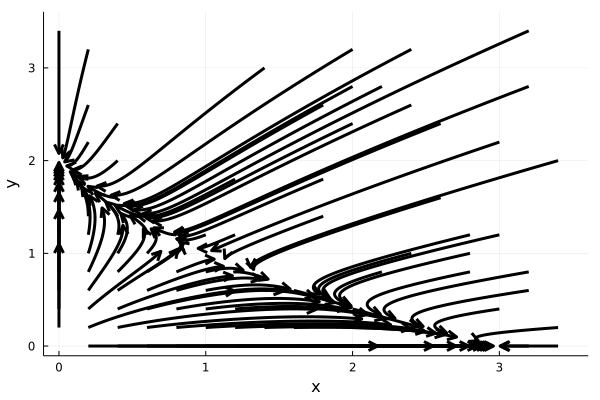

In [3]:
x=0:0.2:3.5
y=0:0.2:3.5
x_grid = x' .* ones(length(x))
y_grid = ones(length(y))' .* y
p = [0.5]
plot(0,0)
for i ∈ eachindex(x_grid)

    if y_grid[i] > (2 - x_grid[i]) # skip most points in the upper right part
        if rand() < 0.85
            continue
        end 
    end 

    plot!(solve(remake(prob; tspan=(0.,1.2),u0=[x_grid[i],y_grid[i]])), 
    vars=(1,2), color=:black, arrows=true, legend=nothing, 
    linewidth=3, xlabel="x", ylabel="y",xlims=[0,3.5],ylims=[0,3.5])

end 
plot!(0,0)
savefig("lv-compete-2d.png")

We have stable nodes / sinks at $(0,2)$ and $(3,0)$, an unstable node at $(0,0)$ and a saddle point at $(1,1)$. $(0,2)$ and $(3,0)$ are only two stable points and eventually all trajectories will end in of them. Are part of the phase space whose initial conditions lead to one attractor (here the stable node) is called its basin of attraction (often short just basin). This model therefore has two different basins of attraction. One to the top left of the stable manifold of the saddle point. All trajectories that start there will lead to the stable node at $(3,0)$. The other at the lower right will lead to the stable node at $(0,2)$. The stable manifold of the saddle point here is therefore also the basin boundary. 

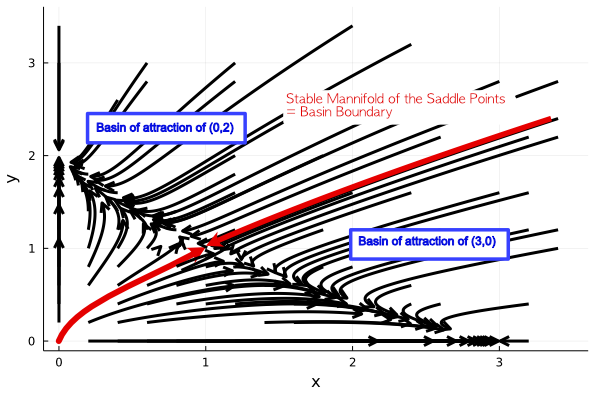



### Lotka-Volterra Model for Predetor-Prey Dynamics 

* Plot a phase portrait for the Lotka-Volterra model for predetor-prey dynamics as it given in the last exercises. What kind of dynamics can you see? 



In [12]:
function lotka_volterra!(dx,x,p,t) # the same as in the exercise 2 solutions 
    α, β, γ, δ = p 
    dx[1] = (α*x[1] - β*x[1]*x[2])
    dx[2] = -γ*x[2] + δ*x[1]*x[2]
end

x₀ = [20., 5.] 
α = 1.
β = 0.5
γ = 1.
δ = 0.2
p = [α, β, γ, δ] 
tspan = (0.,20.)
prob = ODEProblem(lotka_volterra!, x₀, tspan, p)


x=0:1.:20.
y=0:0.5:10.
x_grid = x' .* ones(length(x))
y_grid = ones(length(y))' .* y
plot(0,0)
for i ∈ eachindex(x_grid)
    plot!(solve(remake(prob; tspan=(0.,1.2),u0=[x_grid[i],y_grid[i]])), 
    vars=(1,2), color=:black, arrows=true, legend=nothing, 
    linewidth=1.5, xlabel="x", ylabel="y",xlims=[0,20.],ylims=[0,10.])

end 
plot!(0,0)

The fixed points of the LV predator prey model are at $(0,0)$ and (taken from analytic analysis) at $(\gamma/\delta, \alpha/\beta) = (5,2)$. We can determine their stability with the procedure from the lecture. The Jacobian of the system is 

$J = \begin{pmatrix}\alpha - \beta F & -\beta H\\ \delta F & \delta H - \gamma\end{pmatrix}$

In the origin, this yields: 

$J(0,0) = \begin{pmatrix}\alpha & 0\\ 0 & - \gamma\end{pmatrix}$, those eigenvalues follow directly as $\lambda_1=\alpha$ and $\lambda_2=-\gamma$, so here: $\lambda_1 = 1.$ and $\lambda_2=-1$. Or $\det{A}=-\alpha\gamma < 0$. Therefore $(0,0)$ is a saddle point.

The other, oscillatory  point yields: 

$J(\gamma/\delta, \alpha/\beta) = \begin{pmatrix}0 & -\frac{\beta\gamma}{\delta}\\ \frac{\alpha\delta}{\beta} & 0\end{pmatrix}$, this matrix has a zero trace and therefore purely imaginary eigenvalues. It could be a center, but we don't know for certain as for $\Re({\lambda})\neq 0$ the linearization might not hold anymore. We will not go into the details of a further analytical analysis of these oscillations here, but the visual analysis of the phase portrait shows that we have elliptic, closed orbits around the fixed point $(5,2)$.

## Type Inference and Type Stability

Consider the following implentation of the Lotka-Volterra model. 

In [5]:
α = 1.0
β = 0.5
γ = 1.0
δ = 0.2

function lotka_volterra(x)
    return [α*x[1] - β*x[1]*x[2], -γ*x[2] + δ*x[1]*x[2]]
end

lotka_volterra (generic function with 1 method)

1. Is it type-stable? Why / why not?


In [6]:
@code_warntype(lotka_volterra([20.0, 0.5]))

MethodInstance for lotka_volterra(::Vector{Float64})
  from lotka_volterra(x) in Main at In[5]:6
Arguments
  #self#::Core.Const(lotka_volterra)
  x::Vector{Float64}
Body::Vector
1 ─ %1  = Base.getindex(x, 1)::Float64
│   %2  = (Main.α * %1)::Any
│   %3  = Base.getindex(x, 1)::Float64
│   %4  = Base.getindex(x, 2)::Float64
│   %5  = (Main.β * %3 * %4)::Any
│   %6  = (%2 - %5)::Any
│   %7  = -Main.γ::Any
│   %8  = Base.getindex(x, 2)::Float64
│   %9  = (%7 * %8)::Any
│   %10 = Base.getindex(x, 1)::Float64
│   %11 = Base.getindex(x, 2)::Float64
│   %12 = (Main.δ * %10 * %11)::Any
│   %13 = (%9 + %12)::Any
│   %14 = Base.vect(%6, %13)::Vector
└──       return %14



2. If not, write a type stable version of the function.

In [7]:
function lotka_volterra(x, p)
    α, β, γ, δ = p 
    return [α*x[1] - β*x[1]*x[2], -γ*x[2] + δ*x[1]*x[2]]
end

lotka_volterra (generic function with 2 methods)

In [8]:
@code_warntype(lotka_volterra([20.0, 0.5], [1.0, 0.5, 1.0, 0.2]))

MethodInstance for lotka_volterra(::Vector{Float64}, ::Vector{Float64})
  from lotka_volterra(x, p) in Main at In[7]:1
Arguments
  #self#::Core.Const(lotka_volterra)
  x::Vector{Float64}
  p::Vector{Float64}
Locals
  @_4::Int64
  δ::Float64
  γ::Float64
  β::Float64
  α::Float64
Body::Vector{Float64}
1 ─ %1  = Base.indexed_iterate(p, 1)::Core.PartialStruct(Tuple{Float64, Int64}, Any[Float64, Core.Const(2)])
│         (α = Core.getfield(%1, 1))
│         (@_4 = Core.getfield(%1, 2))
│   %4  = Base.indexed_iterate(p, 2, @_4::Core.Const(2))::Core.PartialStruct(Tuple{Float64, Int64}, Any[Float64, Core.Const(3)])
│         (β = Core.getfield(%4, 1))
│         (@_4 = Core.getfield(%4, 2))
│   %7  = Base.indexed_iterate(p, 3, @_4::Core.Const(3))::Core.PartialStruct(Tuple{Float64, Int64}, Any[Float64, Core.Const(4)])
│         (γ = Core.getfield(%7, 1))
│         (@_4 = Core.getfield(%7, 2))
│   %10 = Base.indexed_iterate(p, 4, @_4::Core.Const(4))::Core.PartialStruct(Tuple{Float64, Int64}, Any

3. Use the `@btime` macro from the `BenchmarkTools` package to compare the performance of the type-stable and type-unstable versions of the function.

In [9]:
using BenchmarkTools
@btime lotka_volterra([20.0, 0.5]);  # type-unstable

  588.162 ns (17 allocations: 400 bytes)


In [10]:
@btime lotka_volterra([20.0, 0.5], [1.0, 0.5, 1.0, 0.2]);  # type-stable

  101.493 ns (3 allocations: 256 bytes)


## Git

Remember to commit and push everything to your Git repository